In [5]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
from fastai.vision import *

In [3]:
!dir

 Volume in drive D is Metadata
 Volume Serial Number is 5427-9D75

 Directory of D:\elephantdetector

02/22/2020  02:18 PM    <DIR>          .
02/22/2020  02:18 PM    <DIR>          ..
02/15/2020  08:53 PM    <DIR>          .ipynb_checkpoints
01/16/2018  11:27 PM             2,306 class_mapping.txt
02/22/2020  02:17 PM    <DIR>          data
02/15/2020  08:48 PM    <DIR>          elephant
02/22/2020  02:18 PM         2,739,836 elephant.ipynb
02/16/2020  12:35 AM     1,060,743,846 elephantdetector.zip
05/14/2019  05:51 PM             1,394 LICENSE.txt
01/30/2020  06:28 PM           532,794 sample.ipynb
05/21/2019  04:03 PM            60,688 train.txt
05/21/2019  04:03 PM            19,132 val.txt
02/16/2020  01:22 AM    <DIR>          webframework
               7 File(s)  1,064,099,996 bytes
               6 Dir(s)  49,662,758,912 bytes free


In [11]:
path = Path('data')
train = path/'train'

In [5]:
tfms = get_transforms(flip_vert=False, max_lighting=0.1, max_zoom=0.5, max_warp=0.)

In [6]:
data = ImageDataBunch.from_folder(path,size=255,ds_tfms=tfms,bs=32)

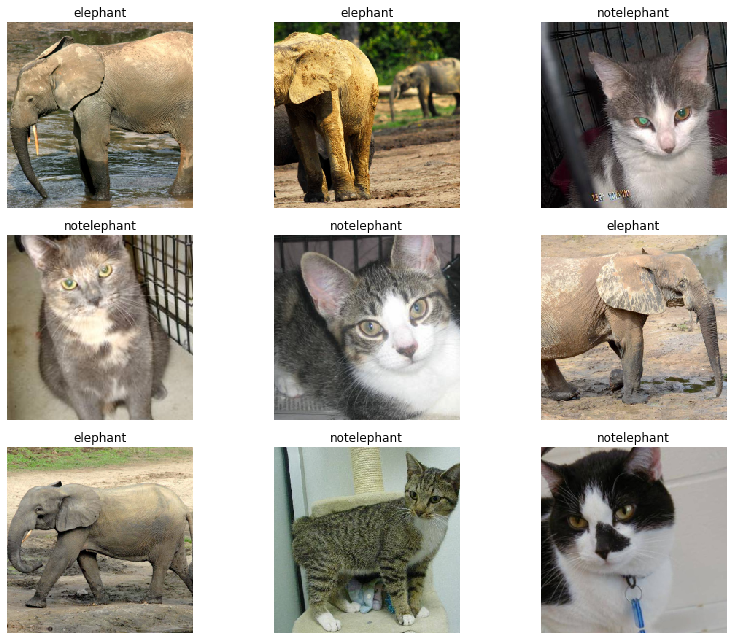

In [7]:
data.show_batch(rows=3, figsize=(12,9))

In [8]:
# acc_02 = partial(accuracy_thresh, thresh=0.2)
# f_score = partial(fbeta, thresh=0.2)
learn = cnn_learner(data, models.resnet34, metrics=error_rate)

In [9]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.105938,0.000030,0.000000,03:13
1,0.030070,0.000371,0.000000,03:21
2,0.021459,0.000387,0.000000,02:59
3,0.010471,0.000661,0.000000,02:44


In [10]:
learn.save('elephant_after_fit_one_cycle')

In [6]:
learn.load('elephant_after_fit_one_cycle')

NameError: name 'learn' is not defined

# Finetuning

In [ ]:
# learn.unfreeze() #Unlock all layers 
# learn.fit_one_cycle(1)

In [ ]:
# learn.lr_find()

In [ ]:
# learn.fit_one_cycle(5, slice(lr))

In [ ]:
# learn.save('stage-1-rn50')

In [13]:
learn.export()

# Testing

In [ ]:
test = ImageList.from_folder(path/'test')

In [ ]:
learn = load_learner(path, test=test)

In [13]:
learn = load_learner(path)

In [ ]:
preds, _ = learn.get_preds(ds_type=DatasetType.Test)

In [ ]:
thresh = 0.2
labelled_preds = [' '.join([learn.data.classes[i] for i,p in enumerate(pred) if p > thresh]) for pred in preds]

In [ ]:
labelled_preds[:5]

In [ ]:
fnames = [f.name[:-4] for f in learn.data.test_ds.items]

In [ ]:
df = pd.DataFrame({'image_name':fnames, 'tags':labelled_preds}, columns=['image_name', 'tags'])

In [ ]:
df.to_csv(path/'submission.csv', index=False)

notelephant


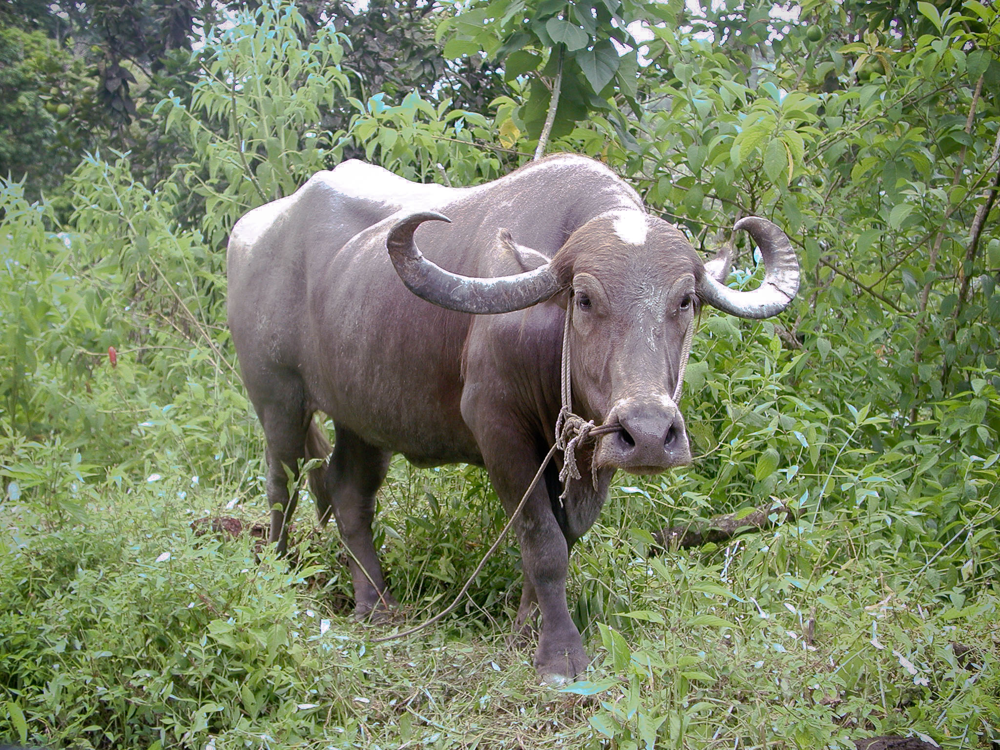

In [14]:
img = open_image('data/false.jpeg')
a,b,c = learn.predict(img)
print(a)
img

# Model has difficulty distinguishing between elephant and Buffallo

In [ ]:
download_images(path/'link.txt',path/'dest',max_pics=200) #Downloading files for buffallo

In [16]:
# Fixed by adding buffallo images to notelephant category

# Loading Video and detecting elephants from frames

In [2]:
import cv2

In [18]:
t = torch.tensor(np.ascontiguousarray(np.flip(frame, 2)).transpose(2,0,1)).float()/255
img = Image(t) # fastai.vision.Image, not PIL.Image
p = learn.predict(img)
print(p)

(Category elephant, tensor(0), tensor([0.9970, 0.0030]))


In [36]:
# stri = c[0].mul(100)

tensor(54.2892)

In [39]:
cap = cv2.VideoCapture('video2.mp4')
i=0 
while(cap.isOpened()):
    ret, frame = cap.read()
    cv2.imshow('frame',frame)
    t = torch.tensor(np.ascontiguousarray(np.flip(frame, 2)).transpose(2,0,1)).float()/255
    img = Image(t) # fastai.vision.Image, not PIL.Image
    a,b,c = learn.predict(img)
    if(str(a)=='elephant'):
        print(i, "- ",str(a) + " Detected with ",c[0])
        i = i + 1 
    else:
        print(str(a))
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()